In [1]:
#1 Import libraries

import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
#2 Import data

d_2010 = gpd.read_file('region_2010.shp')

income = pd.read_csv (r'ACSST5Y2010.S1902_data_with_overlays_2022-02-25T132215.csv')
income = income.iloc[1:]
income.reset_index(drop=True, inplace=True)


In [3]:
d_2010

,cartodb_id,statefp,countyfp,name,atotal,aland,geoid,cw_bx,cw_bk,cw_mn,...,emins_18,emind_18,emser_18,emtot_18,p_as_10e,p_bl_10e,p_hi_10e,p_ot_10e,p_wh_10e,geometry
0,17,34,013,Census Tract 216.01,10.33357,10.14335,34013021601,10,45,234,...,1225.0,10613.0,3110.0,23580.0,183,46,384,53,6800,"POLYGON ((-74.32280 40.90883, -74.32247 40.908..."
1,134,34,013,Census Tract 2,0.30358,0.29497,34013000200,0,0,40,...,76.0,105.0,86.0,296.0,75,427,2098,56,255,"POLYGON ((-74.17520 40.77840, -74.17441 40.778..."
2,137,34,013,Census Tract 10,0.20458,0.20458,34013001000,35,60,55,...,495.0,26.0,176.0,1287.0,74,1779,1188,82,188,"POLYGON ((-74.18469 40.75080, -74.18396 40.750..."
3,153,34,023,Census Tract 77.02,10.80160,10.75454,34023007702,0,84,374,...,129.0,207.0,430.0,1194.0,1001,331,548,144,3387,"POLYGON ((-74.30624 40.37029, -74.30620 40.370..."
4,155,34,023,Census Tract 34.01,2.62115,2.00433,34023003401,0,10,79,...,148.0,733.0,264.0,1225.0,235,299,799,53,2454,"POLYGON ((-74.23489 40.56056, -74.23491 40.560..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5289,5289,36,061,Census Tract 224,0.07517,0.07517,36061022400,155,75,1282,...,455.0,36.0,271.0,1281.0,112,3983,1901,148,283,"POLYGON ((-73.94317 40.81094, -73.94340 40.810..."
5290,5290,36,061,Census Tract 226,0.05907,0.05907,36061022600,100,134,1249,...,455.0,3.0,192.0,1147.0,92,2666,603,118,299,"POLYGON ((-73.94135 40.81344, -73.94180 40.812..."
5291,5291,36,061,Census Tract 228,0.06974,0.06974,36061022800,110,325,1790,...,306.0,11.0,303.0,1216.0,64,3826,792,143,423,"POLYGON ((-73.93946 40.81603, -73.93968 40.815..."
5292,5292,36,061,Census Tract 229,0.13224,0.08149,36061022900,245,214,3293,...,188.0,19.0,364.0,926.0,144,1889,5370,200,697,"POLYGON ((-73.94712 40.82590, -73.94760 40.825..."


In [4]:
#3 Calculate Simpson's diversity index

d_2010["Simpsons_index"] = (1-
                        (
                            (d_2010['cr_bx']*(d_2010['cr_bx']-1)+ d_2010['cr_bk']*(d_2010['cr_bk']-1) 
                             + d_2010['cr_mn']*(d_2010['cr_mn']-1)+ d_2010['cr_qn']*(d_2010['cr_qn']-1) 
                             + d_2010['cr_si']*(d_2010['cr_si']-1))
                            / (d_2010['cr_nyc'] * (d_2010['cr_nyc']-1))
                        )
                       )



In [5]:
#4 Filter data for NYC

d_2010['geoid_5digits'] = d_2010.geoid.astype(str).str[:5]

d_2010_filtered = d_2010[(d_2010['geoid_5digits']=='36061')|
                 (d_2010['geoid_5digits']=='36081')|
                 (d_2010['geoid_5digits']=='36047')|
                 (d_2010['geoid_5digits']=='36005')|
                 (d_2010['geoid_5digits']=='36085')]


income['geoid_5digits'] = income.GEO_ID.astype(str).str[9:14]

income['geoid'] = income.GEO_ID.astype(str).str[9:]

income_filtered = income[(income['geoid_5digits']=='36061')|
                 (income['geoid_5digits']=='36081')|
                 (income['geoid_5digits']=='36047')|
                 (income['geoid_5digits']=='36005')|
                 (income['geoid_5digits']=='36085')]

#Income_filtered







In [48]:
income_filtered_1 = income_filtered[['geoid', 'S1902_C02_001E']]

total_income = income_filtered[['geoid', 'S1902_C01_001E']]


income_filtered_1['geoid'] = income_filtered_1['geoid'].astype('int64')


total_income['geoid'] = total_income['geoid'].astype('int64')
total_income['S1902_C01_001E'] = total_income['S1902_C01_001E'].astype('int64')

C:\Users\Patrycja Raszka\AppData\Local\Temp\ipykernel_7060\479291474.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  income_filtered_1['geoid'] = income_filtered_1['geoid'].astype('int64')
C:\Users\Patrycja Raszka\AppData\Local\Temp\ipykernel_7060\479291474.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_income['geoid'] = total_income['geoid'].astype('int64')
C:\Users\Patrycja Raszka\AppData\Local\Temp\ipykernel_7060\479291474.py:10: SettingWithCopyWarning: 
A value is trying to be set on a co

In [49]:
total_income

,geoid,S1902_C01_001E
88,36005000100,0
89,36005000200,1297
90,36005000400,1531
91,36005001600,1983
92,36005001900,655
93,36005002000,3029
94,36005002300,1968
95,36005002400,0
96,36005002500,1812
97,36005002701,1014


In [19]:
pd.set_option('display.max_rows', None)

In [21]:
income_filtered_1.loc[income_filtered_1["S1902_C02_001E"] == "-", "S1902_C02_001E"] = 0
income_filtered_1.loc[income_filtered_1["S1902_C02_001E"] == "N", "S1902_C02_001E"] = 0
income_filtered_1['S1902_C02_001E'] = income_filtered_1['S1902_C02_001E'].astype('int64')

C:\Users\Patrycja Raszka\AppData\Local\Temp\ipykernel_7060\2552343455.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  income_filtered_1['S1902_C02_001E'] = income_filtered_1['S1902_C02_001E'].astype('int64')


In [23]:
display(income_filtered_1.dtypes)

geoid             int64
S1902_C02_001E    int64
dtype: object

In [10]:
d_2010_filtered['geoid']

68      36047050804
76      36047102000
80      36081075702
81      36005002701
82      36047051602
           ...     
5289    36061022400
5290    36061022600
5291    36061022800
5292    36061022900
5293    36061023000
Name: geoid, Length: 2164, dtype: int64

In [38]:
df_merged = d_2010_filtered.merge(income_filtered_1, on = 'geoid', how = 'left')

In [51]:
total_df_merged = d_2010_filtered.merge(total_income, on = 'geoid', how = 'left')

In [39]:
df_merged_no_zero = df_merged[df_merged.S1902_C02_001E != 0]
df_merged_no_zero

,cartodb_id,statefp,countyfp,name,atotal,aland,geoid,cw_bx,cw_bk,cw_mn,...,emtot_18,p_as_10e,p_bl_10e,p_hi_10e,p_ot_10e,p_wh_10e,geometry,Simpsons_index,geoid_5digits,S1902_C02_001E
0,2098,36,047,Census Tract 508.04,0.03981,0.03981,36047050804,15,1481,1077,...,67.0,255,3374,2068,113,440,"POLYGON ((-73.96141 40.65217, -73.96258 40.651...",0.465701,36047,47523
1,2438,36,047,Census Tract 1020,0.06063,0.06063,36047102000,0,539,314,...,5.0,50,1601,81,48,142,"POLYGON ((-73.88372 40.63768, -73.88444 40.637...",0.000000,36047,93044
2,2571,36,081,Census Tract 757.02,0.13674,0.13674,36081075702,30,224,1250,...,902.0,1147,95,328,87,2824,"POLYGON ((-73.83596 40.72168, -73.83703 40.721...",0.106045,36081,93263
3,2721,36,005,Census Tract 27.01,0.03191,0.03191,36005002701,384,10,354,...,281.0,5,992,2050,38,28,"POLYGON ((-73.91348 40.80426, -73.91443 40.803...",0.502182,36005,30789
4,2727,36,047,Census Tract 516.02,0.03519,0.03519,36047051602,40,700,529,...,195.0,63,2820,828,117,200,"POLYGON ((-73.95764 40.64269, -73.95746 40.642...",0.141184,36047,47980
5,4086,36,061,Census Tract 201.01,0.02128,0.02128,36061020101,80,25,665,...,3276.0,382,143,211,88,907,"POLYGON ((-73.95841 40.80742, -73.95936 40.806...",0.534271,36061,105581
6,4120,36,061,Census Tract 205,0.25315,0.10854,36061020500,39,55,2298,...,3778.0,798,347,529,220,3428,"POLYGON ((-73.96111 40.81183, -73.96134 40.811...",0.582318,36061,153880
7,4222,36,081,Census Tract 287,0.07553,0.07553,36081028700,45,90,1514,...,958.0,1575,136,2397,178,1946,"POLYGON ((-73.88765 40.74725, -73.88778 40.747...",0.193248,36081,58833
8,4294,36,081,Census Tract 94,0.06706,0.06706,36081009400,45,130,284,...,230.0,769,453,626,750,236,"POLYGON ((-73.83506 40.68301, -73.83537 40.682...",0.362472,36081,53091
9,4403,36,081,Census Tract 493.01,0.06337,0.06337,36081049301,0,30,393,...,135.0,682,13,448,27,964,"POLYGON ((-73.89175 40.73448, -73.89201 40.734...",0.538721,36081,65508


In [41]:
df_merged_no_zero.sort_values('S1902_C02_001E')

,cartodb_id,statefp,countyfp,name,atotal,aland,geoid,cw_bx,cw_bk,cw_mn,...,emtot_18,p_as_10e,p_bl_10e,p_hi_10e,p_ot_10e,p_wh_10e,geometry,Simpsons_index,geoid_5digits,S1902_C02_001E
896,3341,36,047,Census Tract 352,0.92317,0.38230,36047035200,0,30,0,...,1443.0,35,224,201,24,762,"POLYGON ((-73.96887 40.57524, -73.96879 40.575...",0.434322,36047,11166
402,2049,36,047,Census Tract 808,0.12426,0.12426,36047080800,0,10,0,...,7054.0,115,841,127,23,91,"POLYGON ((-73.93686 40.65794, -73.93590 40.658...",0.400710,36047,12795
634,2831,36,005,Census Tract 435,2.60491,2.59250,36005043500,0,0,0,...,540.0,0,12,26,0,1,"POLYGON ((-73.89193 40.90981, -73.89181 40.909...",0.659591,36005,13273
1367,3889,36,047,Census Tract 29.01,0.04219,0.04219,36047002901,4,216,192,...,209.0,293,1822,967,71,65,"POLYGON ((-73.97644 40.69637, -73.97642 40.696...",0.556241,36047,17212
1284,3787,36,047,Census Tract 910,0.08188,0.08188,36047091000,0,725,153,...,279.0,34,3776,1694,77,29,"POLYGON ((-73.90085 40.66535, -73.90042 40.663...",0.264669,36047,17514
1541,4141,36,085,Census Tract 133.01,0.02600,0.02600,36085013301,0,40,55,...,25.0,26,861,610,51,85,"POLYGON ((-74.11720 40.63457, -74.11781 40.634...",0.000000,36085,19338
1170,3660,36,047,Census Tract 944.02,0.04125,0.04125,36047094402,15,530,213,...,0.0,12,2208,463,49,154,"POLYGON ((-73.91885 40.63448, -73.91981 40.633...",0.475192,36047,20265
129,2797,36,005,Census Tract 121.02,0.01911,0.01911,36005012102,293,60,74,...,94.0,1,294,1300,25,11,"POLYGON ((-73.88661 40.82533, -73.88777 40.825...",0.619897,36005,20482
1282,3785,36,047,Census Tract 906,0.07561,0.07561,36047090600,40,542,235,...,504.0,20,3106,1356,66,33,"POLYGON ((-73.90635 40.66771, -73.90741 40.667...",0.382680,36047,21068
810,3227,36,081,Census Tract 972.02,0.65974,0.22264,36081097202,0,110,80,...,129.0,23,2127,534,49,62,"POLYGON ((-73.76964 40.59080, -73.77493 40.590...",0.000000,36081,21181


In [42]:
Norm_df_merged_no_zero = df_merged_no_zero

In [43]:
from sklearn.preprocessing import minmax_scale, scale
Norm_df_merged_no_zero['S1902_C02_001E'] = minmax_scale(Norm_df_merged_no_zero['S1902_C02_001E'])
Norm_df_merged_no_zero

C:\Users\Patrycja Raszka\anaconda3\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,cartodb_id,statefp,countyfp,name,atotal,aland,geoid,cw_bx,cw_bk,cw_mn,...,emtot_18,p_as_10e,p_bl_10e,p_hi_10e,p_ot_10e,p_wh_10e,geometry,Simpsons_index,geoid_5digits,S1902_C02_001E
0,2098,36,047,Census Tract 508.04,0.03981,0.03981,36047050804,15,1481,1077,...,67.0,255,3374,2068,113,440,"POLYGON ((-73.96141 40.65217, -73.96258 40.651...",0.465701,36047,0.080218
1,2438,36,047,Census Tract 1020,0.06063,0.06063,36047102000,0,539,314,...,5.0,50,1601,81,48,142,"POLYGON ((-73.88372 40.63768, -73.88444 40.637...",0.000000,36047,0.180656
2,2571,36,081,Census Tract 757.02,0.13674,0.13674,36081075702,30,224,1250,...,902.0,1147,95,328,87,2824,"POLYGON ((-73.83596 40.72168, -73.83703 40.721...",0.106045,36081,0.181140
3,2721,36,005,Census Tract 27.01,0.03191,0.03191,36005002701,384,10,354,...,281.0,5,992,2050,38,28,"POLYGON ((-73.91348 40.80426, -73.91443 40.803...",0.502182,36005,0.043296
4,2727,36,047,Census Tract 516.02,0.03519,0.03519,36047051602,40,700,529,...,195.0,63,2820,828,117,200,"POLYGON ((-73.95764 40.64269, -73.95746 40.642...",0.141184,36047,0.081227
5,4086,36,061,Census Tract 201.01,0.02128,0.02128,36061020101,80,25,665,...,3276.0,382,143,211,88,907,"POLYGON ((-73.95841 40.80742, -73.95936 40.806...",0.534271,36061,0.208318
6,4120,36,061,Census Tract 205,0.25315,0.10854,36061020500,39,55,2298,...,3778.0,798,347,529,220,3428,"POLYGON ((-73.96111 40.81183, -73.96134 40.811...",0.582318,36061,0.314886
7,4222,36,081,Census Tract 287,0.07553,0.07553,36081028700,45,90,1514,...,958.0,1575,136,2397,178,1946,"POLYGON ((-73.88765 40.74725, -73.88778 40.747...",0.193248,36081,0.105173
8,4294,36,081,Census Tract 94,0.06706,0.06706,36081009400,45,130,284,...,230.0,769,453,626,750,236,"POLYGON ((-73.83506 40.68301, -73.83537 40.682...",0.362472,36081,0.092504
9,4403,36,081,Census Tract 493.01,0.06337,0.06337,36081049301,0,30,393,...,135.0,682,13,448,27,964,"POLYGON ((-73.89175 40.73448, -73.89201 40.734...",0.538721,36081,0.119901


In [44]:
df_merged_no_zero.sort_values('S1902_C02_001E')

,cartodb_id,statefp,countyfp,name,atotal,aland,geoid,cw_bx,cw_bk,cw_mn,...,emtot_18,p_as_10e,p_bl_10e,p_hi_10e,p_ot_10e,p_wh_10e,geometry,Simpsons_index,geoid_5digits,S1902_C02_001E
896,3341,36,047,Census Tract 352,0.92317,0.38230,36047035200,0,30,0,...,1443.0,35,224,201,24,762,"POLYGON ((-73.96887 40.57524, -73.96879 40.575...",0.434322,36047,0.000000
402,2049,36,047,Census Tract 808,0.12426,0.12426,36047080800,0,10,0,...,7054.0,115,841,127,23,91,"POLYGON ((-73.93686 40.65794, -73.93590 40.658...",0.400710,36047,0.003594
634,2831,36,005,Census Tract 435,2.60491,2.59250,36005043500,0,0,0,...,540.0,0,12,26,0,1,"POLYGON ((-73.89193 40.90981, -73.89181 40.909...",0.659591,36005,0.004649
1367,3889,36,047,Census Tract 29.01,0.04219,0.04219,36047002901,4,216,192,...,209.0,293,1822,967,71,65,"POLYGON ((-73.97644 40.69637, -73.97642 40.696...",0.556241,36047,0.013340
1284,3787,36,047,Census Tract 910,0.08188,0.08188,36047091000,0,725,153,...,279.0,34,3776,1694,77,29,"POLYGON ((-73.90085 40.66535, -73.90042 40.663...",0.264669,36047,0.014006
1541,4141,36,085,Census Tract 133.01,0.02600,0.02600,36085013301,0,40,55,...,25.0,26,861,610,51,85,"POLYGON ((-74.11720 40.63457, -74.11781 40.634...",0.000000,36085,0.018031
1170,3660,36,047,Census Tract 944.02,0.04125,0.04125,36047094402,15,530,213,...,0.0,12,2208,463,49,154,"POLYGON ((-73.91885 40.63448, -73.91981 40.633...",0.475192,36047,0.020076
129,2797,36,005,Census Tract 121.02,0.01911,0.01911,36005012102,293,60,74,...,94.0,1,294,1300,25,11,"POLYGON ((-73.88661 40.82533, -73.88777 40.825...",0.619897,36005,0.020555
1282,3785,36,047,Census Tract 906,0.07561,0.07561,36047090600,40,542,235,...,504.0,20,3106,1356,66,33,"POLYGON ((-73.90635 40.66771, -73.90741 40.667...",0.382680,36047,0.021848
810,3227,36,081,Census Tract 972.02,0.65974,0.22264,36081097202,0,110,80,...,129.0,23,2127,534,49,62,"POLYGON ((-73.76964 40.59080, -73.77493 40.590...",0.000000,36081,0.022097


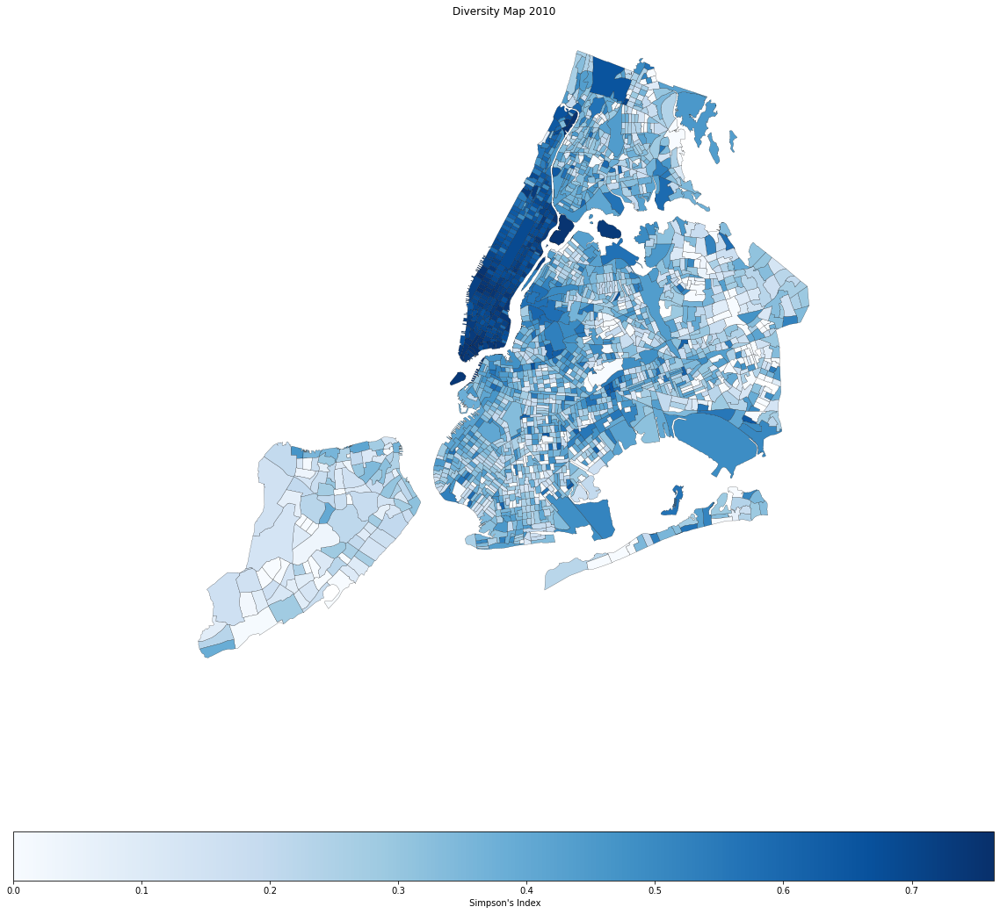

In [26]:
#5 PLOT


#fig, ax = plt.subplots(1, 1)
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.1)
Diversity_Map_2010 = d_2010_filtered.plot(column = 'Simpsons_index', 
                 cmap = 'Blues', edgecolor = "black", linewidth=0.2,
                 legend = True, figsize = (20,20),
                 legend_kwds={'label': " Simpson's Index",
                        'orientation': "horizontal"},
                       )


#TITLE

Diversity_Map_2010.set(title='Diversity Map 2010')


Diversity_Map_2010.set_axis_off();
# makeing it 3d plt.axis('equal')

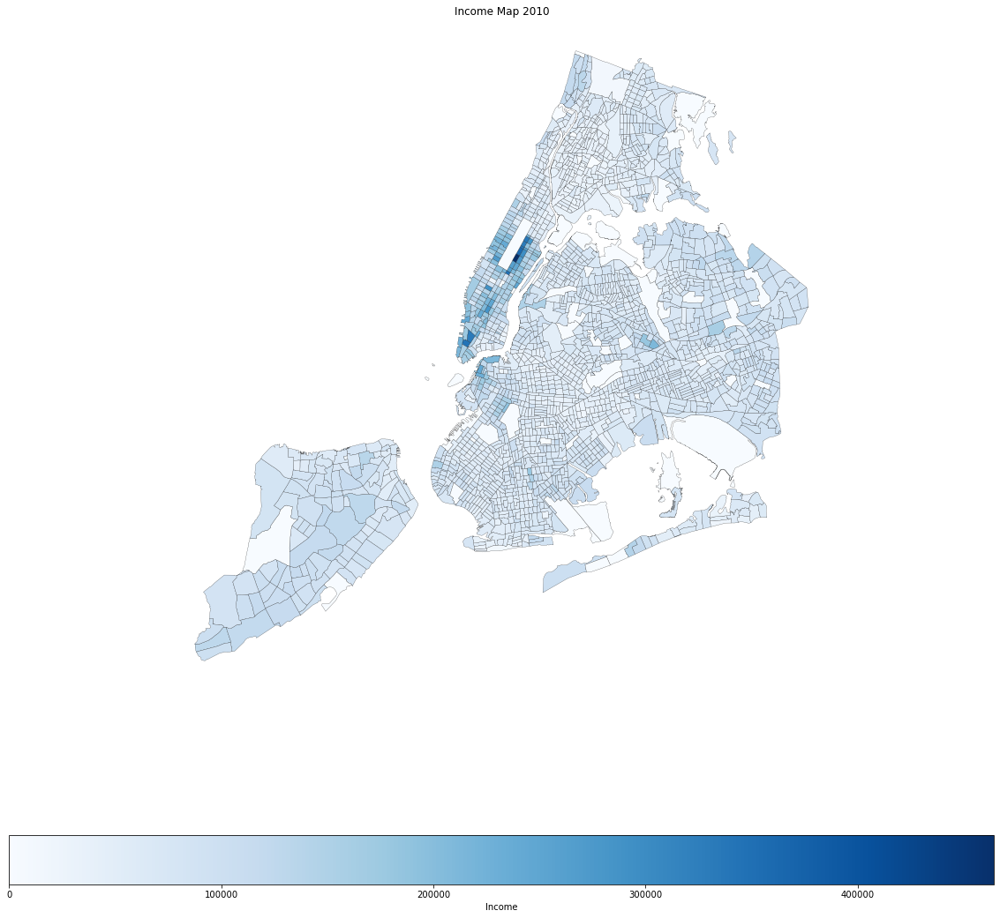

In [40]:
income_Map_2010 = df_merged.plot(column = 'S1902_C02_001E', 
                 cmap = 'Blues', edgecolor = "black", linewidth=0.2,
                 legend = True, figsize = (20,20),
                 legend_kwds={'label': "Income",
                        'orientation': "horizontal"},
                       )

income_Map_2010.set(title='Income Map 2010')


income_Map_2010.set_axis_off();


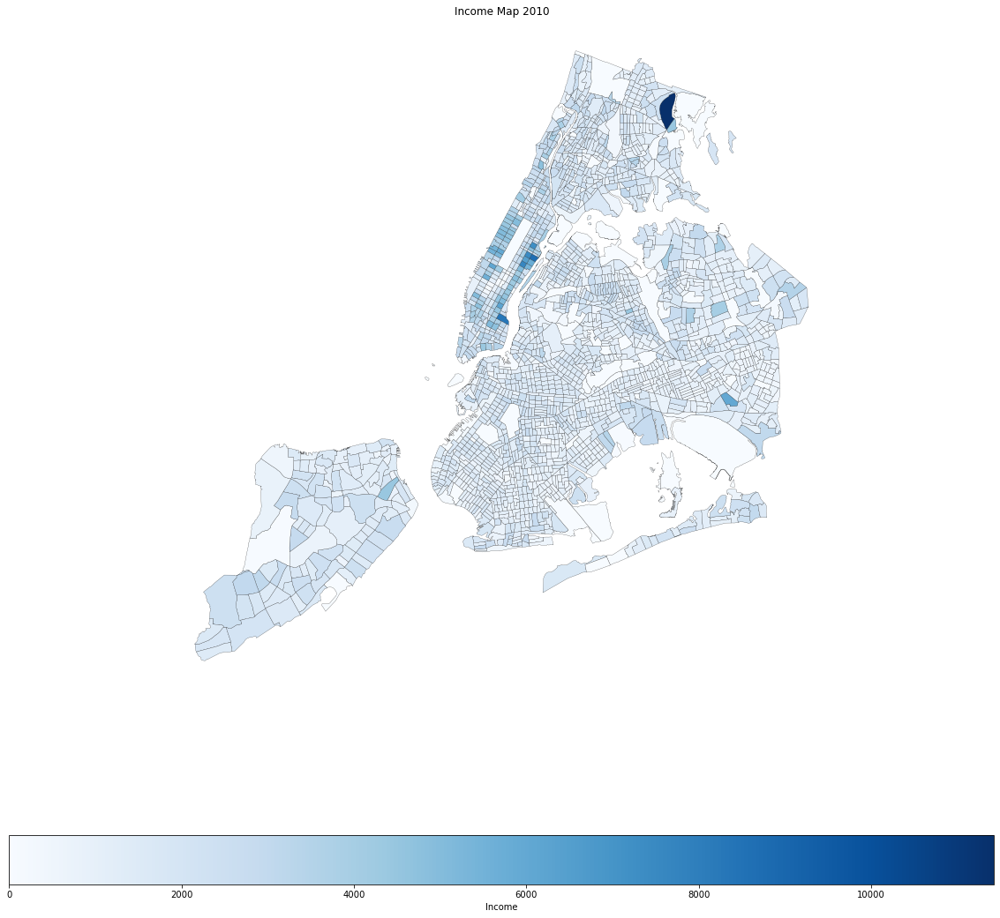

In [53]:
 total_income_Map_2010 = total_df_merged.plot(column = 'S1902_C01_001E', 
                 cmap = 'Blues', edgecolor = "black", linewidth=0.2,
                 legend = True, figsize = (20,20),
                 legend_kwds={'label': "Income",
                        'orientation': "horizontal"},
                       )

total_income_Map_2010.set(title='Income Map 2010')


total_income_Map_2010.set_axis_off();


In [ ]:
total_df_merged